# Sistemas Inteligentes

## Exercício Computacional 5 - Otimização

### Identificação do Aluno

#### Nome Completo

Dimitri Leandro de Oliveira Silva

### Problema a ser trabalhado

#### Identificação do Problema

Otimização da rota em um grafo

#### Explicação do Problema

Dado um grafo ponderado e não orientado, encontrar o melhor caminho indo do vértice inicial até o último vértice. Isto é, buscar rotas que minimizem o custo total da viagem. 

O custo para ir do vértice N ao vértice M pode ser interpretado como a distância entre os nós, preço gasto com a gasolina, tempo de viagem ou qualquer outro significado conveniente ao leitor.

### Técnica

#### Identificação da Técnica

Esse exercício computacional irá implementar um algoritmo genético para tentar solucionar o problema apresentado.

#### Explicação da Técnica

Os algoritmos genéticos têm inspiração na Teoria da Seleção Natural de Darwin. Esses algoritmos são usados para otimizar funções, como é o caso do problema proposto.

De acordo com as referências, esse tipo de algoritmo possuem cinco elementos essenciais:

<br/>

**População Inicial:**

O algoritmo começa criando uma população inicial de N indivíduos. Cada um representa uma solução para o problema que se busca otimizar.

Os indivíduos possuem uma série da parâmetros que podem ser pensados como os gênes de cada um.

No caso dessa atividade, os gênes dos indivíduos serão os vértices visitados até chegar ao objetivo. Por exemplo, supondo um grafo de 100 vértices, um indivíduo pode ser representado pelo vetor [0, 32, 7, 84, 99], indicando que ele saiu do vértice 0, passou pelos vértices 32, 7, 84 para, enfim, chegar ao vértice final.

<br/>

**Função Fitness:** 

Essa é a função que se busca otimizar. Cada indivíduo do algoritmo tem um valor de Fitness que pode ser interpretado como o quão bem adaptado ao ambiente esse indivíduo está. A probabilidade de que um indivíduo seja selecionado para reprodução é baseado em seu valor de Fitness, assim como ocorre na natureza, onde os indivíduos mais aptos a sobreviver têm maior probabilidade de se reproduzir.

No caso dessa atividade, a função Fitness será o custo do caminho percorrido por um indivíduo até chegar ao vértice final. Ou seja, a fim de otimizar essa função, o algoritmo implementado deve minimiza-la.

<br/>

**Seleção**

Na natureza, os indivíduos mais adaptados ao meio têm maior chance de reprodução. Nessa caso, o algoritmo genético não é diferente. Busca-se selecionar os melhores indivíduos para reprodução a fim de gerar descendentes com características semelhantes. A probabilidade de que um indivíduo seja selecionado é baseado em seu Fitness.

<br/>

**Reprodução**

Nesse ponto, almeja-se criar novos indivíduos a partir de dois outros indivíduos progenitores. Dependendo do problema a ser solucionado, cada algoritmo genético pode apresentar uma resolução diferente para a reprodução. 

No caso dessa atividade, como cada indivíduo é uma rota, seleciona-se aleatóriamente um vértice em comum para gerar novas rotas (filhos). Por exemplo, os indivíduos A -> [0, 15, 44, 30, 61, 29, 99] e B -> [0, 22, 87, 15, 71, 99] possuem apenas o vértice 15 em comum (ignorando o vértice inicial e final). Logo, existem duas possibilidades de criar novos indivíduos: 

O primeiro filho pode ser obtido pela combinação do inicio do indivíduo A até o vértice em comum com o final do indivíduo B, da seguinte forma: [0, 15, 71, 99]. 

Já o segundo filho, pela combinação do começo do indivíduo B com o final do indivíduo A: [0, 22, 87, 15, 44, 30, 61, 29, 99].

<br/>

**Mutação**

Os novos indivíduos criados na reprodução têm uma baixa probabilidade de sofrer alguma mutação. Isso acontece tanto na natureza quanto nos algoritmos genéticos.

No caso dessa atividade, todos os novos individuos criados passam pela função de mutação. Caso um valor escolhido aleatoriamente antre 0 e 1 seja menor que a probabilidade do indivíduo sofrer mutação, escolhe-se aleatoriamente um vértice da rota e, a partir dalí, esse indivíduo passa a ter uma rota diferente.

<br/>

Referência: https://towardsdatascience.com/introduction-to-genetic-algorithms-including-example-code-e396e98d8bf3

## Desenvolvimento

O código desenvolvido nessa atividade foi reproduzido através de observações feitas em outro código disponível na internet: https://github.com/gmichaelson/GA_in_python

O autor consentiu a utilização e modificação do código original, como pode ser visto nos comentários do seguinte vídeo: https://www.youtube.com/watch?v=uCXm6avugCo

Em princípio, o código foi copiado na íntegra para esse notebook e a tradução começou a ser feita. Em diversas partes do código, optou-se por desenvolver o algorítmo de maneira independente ou de forma e ordem diferentes à implementação original. Essas partes estarão devidamente apontadas pelos comentários feitos no decorrer do código.

Outra observação importante a ser feita é que duas bibliotecas incomuns à disciplina foram utilizadas nessa atividade: **seaborn** e **networkx**.

A primeira foi utilizada para plotar o caminho feito por um indivíduo sobre a matriz de adjacência do grafo. A segunda contém uma implementação do algorítmo de Dijkstra que será utilizado para verificar qual é, de fato, o melhor caminho a ser seguido para que se vá do vértice inicial até o vértice final.

O Algoritmo de Dijkstra calcula de maneira determinística o melhor caminho entre vértices de um grafo. Portanto, ele será utilizado para comparar a solução obtida pelo algoritmo genético com a resolução definitiva do problema. 

<br/>

Referências: 

http://www.inf.ufsc.br/grafos/temas/custo-minimo/dijkstra.html

http://www.nce.ufrj.br/GINAPE/VIDA/alggenet.htm

<font color='red' style='bold'>
    <b>
        pip install seaborn
        <br/>
        pip install networkx
    </b>
</font>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import random
import copy
import seaborn as sns
import networkx as nx

In [2]:
#DEFININDO ALGUNS PARÂMETROS PARA PLOTAR GRÁFICOS
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
params = {'figure.figsize': [7, 4], 
          'axes.labelsize': 12,
          'axes.titlesize':16, 
          'font.size': 12,
          'legend.fontsize': 12, 
          'xtick.labelsize': 10, 
          'ytick.labelsize': 10
         }

plt.rcParams.update(params)

### Implementação

#### Função criarMatrizAdjacencia

O grafo é o elemento central do problema dessa atividade. Grafos podem ser representados por uma matriz de adjacência, onde cada linha representa as ligações de um vértice do grafo à outros nós. Cada valor dessa matriz é o custo necessário para ir de um vértice N para um vértice M.

Por exemplo, uma matriz de adjacência está representada a seguir: 

<table>
  <tr>
    <th></th>
    <th>V1</th>
    <th>V2</th>
    <th>V3</th>
    <th>V4</th>
  </tr>
  <tr>
    <th>V1</th>
    <td>0</td>
    <td>3</td>
    <td>0</td>
    <td>9</td>
  </tr>
  <tr>
    <th>V2</th>
    <td>3</td>
    <td>0</td>
    <td>0</td>
    <td>1</td>
  </tr>
  <tr>
    <th>V3</th>
    <td>0</td>
    <td>0</td>
    <td>0</td>
    <td>4</td>
  </tr>
  <tr>
    <th>V4</th>
    <td>9</td>
    <td>1</td>
    <td>4</td>
    <td>0</td>
  </tr>
</table>

A linha **V1** diz que o vértice um se liga aos vértices dois e quatro com pesos 3 e 9, respectivamente. Zeros na matriz significam que não há ligação entre os vértices envolvidos. Também é importante dizer que, por não ser direcional, essa matriz é simétrica ao redor da diagonal principal.

O código abaixo foi adaptado do código original com algumas alterações. Foi feita uma modificação para que todos os vértices da matriz fossem utilizados, pois, no algoritmo procedente não havia garantia de que uma linha da matriz iria conter algum valor diferente de zero. Ou seja, um determinado vértice do grafo poderia não fazer ligação com nenhum outro, mostrando-se inútil. Além disso, o último vértice do grafo (objetivo final da rota) poderia ser esse vértice sem ligações, fazendo com que fosse impossível criar uma rota que chegasse ao destino.

A funçaõ recebe como parâmetros a probabilidade de um vértice N não fazer ligação com um vértice M (probabilidadeZero) e o tamanho da matriz (tamanho).

In [3]:
# Essa função cria a matriz de adjacência que representa o grafo. Ela recebe dois parâmetros,
# o primeiro é a probabilidade de sair um zero em cada posição da matriz (significa que 
# os vértices não estão ligados)
def criarMatrizAdjacencia(probabilidadeZero, tamanho):
    
    # Criando a matriz quadrada apenas com zeros nas dimensões tamanho x tamanho
    mapa = np.zeros((tamanho, tamanho), dtype=int)
    
    # Preenchendo a matriz.
    # É importante lembrar que uma matriz de adjacência é simétrica, isto é, os valores acima
    # da diagonal principal devem ser simétricos em relação aos valores abaixo dessa diagonal
    for linha in range(0, tamanho):
        for coluna in range (0, linha):
            
            # A função random retorna um valor entre 0 e 1, logo, se o valor retornado por
            # essa função for maior que probabilidadeZero, então posso fazer uma ligação 
            # entre vértices na matriz de adjacência.
            # O custo de ir de um vértice para outro será um número inteiro aleatório entre 1 e 10
            if random.random() > probabilidadeZero:
                
                # Acima da diagonal principal
                mapa[linha][coluna] = random.randint(1, 10)
                
                # Repetindo o valor na parte espelhada da matriz
                mapa[coluna][linha] = mapa[linha][coluna]
                
    # No código original, não havia garantia que o último vértice tinha ligações com outros, ou seja, 
    # os individuos ficavam mudando suas rotas tentando chegar à um lugar impossível de ser visitado.
    # Aliás, no código original não havia garantia nenhuma de que TODOS os vértices seriam utilizados.
    # Portanto, o bloco de código abaixo verificará vértice por vértice se algum deles não leva
    # a lugar nenhum. Se o vértice não estiver sendo utilizado, darei pelo menos uma ligação a ele
    for linha in range(0, tamanho):
        
        qtdLigacoes = np.nonzero(mapa[linha])
        
        # Se não está ligado a nenhum outro vértice
        if len(qtdLigacoes[0]) == 0:
            
            # Escolhendo aleatoriamente um vértice para fazer a ligação 
            verticeAleatorio = random.randint(0, tamanho - 1)            
            mapa[linha][verticeAleatorio] = random.randint(1, 10)
            mapa[verticeAleatorio][linha] = mapa[linha][verticeAleatorio]
                
    return mapa

#### Função criarNovoIndividuo

Como abordado anteriormente, cada indivíduo será um vetor que representa uma rota. Todos os indivíduos sairão do vértice 0 com o objetivo de chegar ao último vértice do grafo.

Portanto, essa função começa criando um indivíduo apenas com o vértice zero. Logo depois, verifica para onde o último vértice do indivíduo pode levar e seleciona aleatoriamente o próximo passo. A função repete a última instrução até que o indivíduo chegue ao vértice final do grafo.

In [4]:
# Essa função cria um novo indivíduo. Cada indivíduo será um vetor que representa uma rota a ser seguida.
# O objetivo de todos os indivíduos é sair do vértice 0 e chegar ao último.
# Por exemplo, o possível indivíduo [0, 5, 83, 44, 99] representa uma rota saindo do vértice 0 (todos os 
# indivíduos começarão no vértice 0), indo para o vértice 5, depois para o 83 e assim sucessivamente 
# até chegar ao último vértice (objetivo).
def criarNovoIndividuo(mapa):
    
    # O objetivo é chegar no último vértice
    objetivo = len(mapa) - 1
    
    # Criando o novo individuo começando no vértice 0
    novoIndividuo = np.zeros(1, dtype=int)
    
    # Variavel que vai indicar se a rota deve continuar. Ao chegar no objetivo, esse valor será falso
    continuarRota = True
    
    # Contador da posição que representa a quantidade de vértices que o novo individuo visita
    # Por enquanto, ele só está no vértice 0, portanto, o vetor só vai até a posição 0
    i = 0
    
    # Criando a rota
    while continuarRota:
        
        # A função nonzero retorna os indices de um vetor que não são zero.
        # individuo[i] é a linha da matriz de adjacência que mostra o vértice atual do novoIndividuo
        # Logo, verticesPossiveis será um vetor com os próximos possíveis vértices a serem visitados
        verticesPossiveis = np.nonzero(mapa[novoIndividuo[i]])
        
        # Vou escolher aleatoriamente um indice dentro de indicesPossiveis para ser o próximo vértice
        posicaoAleatoria = random.randint(0, len(verticesPossiveis[0]) - 1)
        
        # Colocando o novo vértice no vetor do individuo e dizendo que ele ganhou mais um vértice
        novoIndividuo = np.append(novoIndividuo, verticesPossiveis[0][posicaoAleatoria])
        i += 1
        
        # Verificando se chegou no objetivo
        if novoIndividuo[i] == objetivo:
            continuarRota = False
                                  
    return novoIndividuo

#### Função criarPopulacaoInicial

Essa função cria a quantidade de indivíduos desejados para a população inicial, armazenando-os em um vetor **populacao** para depois retornar esse mesmo vetor.

Essa função sofreu uma alteração muito importante em relação à original. Antes, não era possível definir o mínimo de vértices que os indivíduos da população inicial iriam visitar, fazendo com que, ocasionalmente, alguns indivíduos da população inicial tivessem um fitness muito bom. Nessa atividade isso é um problema, pois, já que deseja-se observar a evolução dos indivíduos durante o passar das gerações, é preferível que os primeiros indivíduos tenham rotas pouco eficientes.

In [5]:
# Essa função cria a população inicial. Ela recebe como parâmetros o tamanho desejado da população e
# o mapa (matriz de adjacência).
def criarPopulacaoInicial (tamanhoPopulacao, mapa, qtdMinVerticesNovoIndividuo):
    
    populacao = []
    
    # Criando os indivíduos e colocando-os no vetor populacao[]
    for i in range(0, tamanhoPopulacao):
        
        individuo = criarNovoIndividuo(mapa)
        while len(individuo) < qtdMinVerticesNovoIndividuo:
            individuo = criarNovoIndividuo(mapa)
        
        populacao.append(individuo)
        
    return populacao

#### Função fitness

Essa é a função que se busca minimizar. O valor dessa função para cada indivíduo é a soma de todos os custos envolvidos durante a viagem do vértice inicial ao final. 

Portanto, essa função precisa receber como parâmetros um indivíduo e a matriz de adjacência do grafo. Assim, ela irá verificar a rota desse indivíduo para ir somando os custos entre os vértices visitados.

In [6]:
# Função fitness. Ela calcula o quão bom é um indivíduo somando os custos presentes na rota desse indivíduo.
# O melhor indivíduo possível é aquele que chega ao objetivo com o MENOR custo possível
def fitness(individuo, mapa):
    
    custoTotal = 0
    
    # Passando de vértice em vértice para ir somando o custo
    for verticeAtual in range(1, len(individuo)):
        custoTotal += mapa[individuo[verticeAtual-1]][individuo[verticeAtual]]

    return custoTotal

#### Função calcularFitnessPopulacao

Posteriormente, será necessário ordenar todos os indivíduos na ordem de melhor para o pior fitness para que seja possível selecionar os melhores para reprodução. O código original não precisava ordenar os indivíduos, mas como muitas alterações foram feitas na função de seleção, foi necessário implementar essa parte nesse notebook.

A função abaixo existe na implementação original, mas, aqui, ela será utilizada para outros propósitos. Ela recebe a população atual e retorna um vetor contendo o respectivo Fitness de cada indivíduo.

In [7]:
# Função que retorna um vetor contendo o fitness de cada individuo na população.
def calcularFitnessPopulacao(populacao, mapa):
    
    vetorFitness = []
    
    for individuo in populacao:
        a = fitness(individuo, mapa)
        vetorFitness.append(a)
        
    return vetorFitness

#### Função realizarMutacao

Na implementação original, essa função recebia um novo indivíduo e uma probabilidade de que ocorresse mutação. Para cada vértice do indivíduo havia a mesma probabilidade de que ocorresse mutação e, a partir dalí, a rota era reconstruída. Ou seja, o mesmo indivíduo poderia sofrer diversas mutações de uma vez. Em outras palavras, um indivíduo com 10 vértices poderia sofrer alterações do vértice 3 em diante, passando a ter um número diferente de vértices. Nesse momento, a função não era interrompida, fazendo com que esse indivíduo pudesse sofrer outra mutação do vértice 7 em diante, por exemplo, e assim sucessivamente.

A função foi reescrita de modo que se verifica apenas uma vez se irá ocorrer mutação. Se sim, então um vértice do indivíduo é selecionado aleatoriamente e, a partir dali, a rota é reformulada.

In [8]:
# Função que realiza uma mutação em um novo indivíduo. Essa função foi implementada de maneira 
# totalmente diferente em relação ao código original. Essa função tem um bloco de código muito semelhante
# à função criarNovoIndividuo.
def realizarMutacao(individuo, probabilidadeMutacao, mapa):
    
    # Probabilidade de ocorrer mutação
    if random.random() < probabilidadeMutacao:
        
        # Escolhendo aleatoriamente um vértice para ser o ponto a partir do qual ocorre mutação na rota
        verticeAleatorio = random.sample(individuo, 1)
        
        # O individuo sofrerá mutação a partir do vértice aleatório, logo, o início da rota é igual
        individuo = [vertice for index, vertice in enumerate(individuo) if index <= individuo.index(verticeAleatorio)]

        # A partir daí, é criada a nova rota até o vértice objetivo (essa parte do código é igual
        # à função criarNovoIndividuo)
        objetivo = len(mapa) - 1
        continuarRota = True
        i = len(individuo) - 1
    
        while continuarRota:
                
                verticesPossiveis = np.nonzero(mapa[individuo[i]])
                posicaoAleatoria = random.randint(0, len(verticesPossiveis[0]) - 1)
                individuo = np.append(individuo, verticesPossiveis[0][posicaoAleatoria])
                i += 1
                
                if individuo[i] == objetivo:
                    continuarRota = False          
    
    return individuo

#### Função crossover

Outra função que teve o código ligeiramente alterado em relação à implementação procedente, apesar de produzir o mesmo resultado. Essa função recebe um indivíduo pai e um indivíduo mãe para retornar dois novos descendentes.

A principal modificação foi em relação à chamada da função **realizarMutacao** que, originalmente, era chamada em outro momento do algoritmo. Preferiu-se chamar essa função logo após que os novos indivíduos fossem concebidos para que a função **crossover** retornasse a nova prole em seu formato definitivo. Ademais, muitos comandos foram substituídos para tornar o código mais intuitivo.

In [9]:
# Função que faz o cruzamento entre dois indivíduos gerando dois filhos diferentes
def crossover(individuoPai, individuoMae, probabilidadeMutacao, mapa):
    
    # O obj verticesComuns será tipo set, que é como um vetor. Esse vetor conterá os elementos
    # em comum entre individuoPai e individuoMae, dessa forma, será possível juntar as duas rotas
    # a partir de um desses elementos em comum. 
    verticesComuns = set(individuoPai) & set(individuoMae)
    
    # Se só houverem dois elementos em comum, só podem ser os vértices 0 e objetivo, ou seja,
    # não é possível fazer o cruzamento, os filhos serão idênticos aos pais
    if len(verticesComuns) == 2:
        return individuoPai, individuoMae
    
    # Se o código continuou, então é possível fazer o cruzamento. Aqui, devo selecionar um ponto em comum
    # para que haja o cruzamento das rotas. Por isso, a primeira coisa a fazer é remover o vértice 0 e
    # o vértice objetivo, pois quero escolher um vértice no meio das duas rotas, caso contrário, as rotas
    # continuariam iguais
    verticesComuns.remove(0)
    verticesComuns.remove(max(individuoPai))
    
    # A partir daqui decidi fazer um código diferente do original, mas com os mesmos resultados
    # Transformando os vetores em listas comuns do python 
    verticesComuns = list(verticesComuns)
    individuoPai = list(individuoPai)
    individuoMae = list(individuoMae)

    # Escolhendo um vértice aleatoriamente para ser o ponto de cruzamento entre as rotas do pai e da mãe
    verticeAleatorio = random.sample(verticesComuns, 1)
    
    # Criando a primeira parte da rota do filho (a primeira parte do filho será a rota do pai até o 
    # vértice aleatório)
    primeiraParte = [vertice for index, vertice in enumerate(individuoPai) if index <= individuoPai.index(verticeAleatorio)]
    
    # A segunda parte será a rota da mãe do ponto de cruzamento até o final
    segundaParte = [vertice for index, vertice in enumerate(individuoMae) if index > individuoMae.index(verticeAleatorio)]

    # Concatenando as duas listas para criar o filho 1
    filho1 = primeiraParte + segundaParte
    
    # Agora será executado o mesmo código para criar o filho 2 a partir de outro ponto de cruzamento
    verticeAleatorio = random.sample(verticesComuns, 1)
    primeiraParte = [vertice for index, vertice in enumerate(individuoPai) if index <= individuoPai.index(verticeAleatorio)]
    segundaParte = [vertice for index, vertice in enumerate(individuoMae) if index > individuoMae.index(verticeAleatorio)]
    filho2 = primeiraParte + segundaParte
    
    # No código original a mutação era realizada em outro momento, mas prefiro que a mutação ocorra
    # logo no nascimento dos novos indivíduos, como acontece na natureza
    filho1 = realizarMutacao(filho1, probabilidadeMutacao, mapa)
    filho2 = realizarMutacao(filho2, probabilidadeMutacao, mapa)
       
    return np.array(filho1), np.array(filho2)

#### Função ordenarIndividuos

Como mencionado anteriormente, a seleção dos melhores indivíduos da população para reprodução depende de que o vetor **populacao** esteja devidamente ordenado do melhor fitness para o pior. A função abaixo usa o algoritmo Selection Sort para ordenar o vetor **popualacao** de acordo com o fitness de cada indivíduo. É importante lembrar que **vetorFitness** também será reorganizado para manter o arranjo **indivíduos <-> fitness**.

In [10]:
# Função que recebe a população e a ordena de acordo com o fitness de cada indivíduo.
def ordenarIndividuos(populacao, vetorFitness):
    
    for i in range(0, len(vetorFitness)):
        
        indexMenorFitness = i
        
        for j in range(i, len(vetorFitness)):
            
            if vetorFitness[j] < vetorFitness[indexMenorFitness]:                
                # O novo menor é o j
                indexMenorFitness = j
        
        # Trocando o indivíduo
        individuoAux = populacao[i]
        populacao[i] = populacao[indexMenorFitness]
        populacao[indexMenorFitness] = individuoAux
                
        # Trocando o fitness
        fitnessAux = vetorFitness[i]
        vetorFitness[i] = vetorFitness[indexMenorFitness]
        vetorFitness[indexMenorFitness] = fitnessAux
    
    return populacao, vetorFitness

#### Função selecionarIndividuo

Essa função foi implementada de forma totalmente diferente da elaboração original. A função abaixo não recebe parâmetros e retorna apenas um índice que representa qual indivíduo da população deve ser selecionado para reprodução. Daí a importância de manter o vetor **populacao** ordenado.

Da forma que foi implementada, essa função retorna o índice 0 (melhor indivíduo) em 50% das vezes; o índice 1 em 25% das vezes; o índice 2 em 12,5% das vezes; e assim sucessivamente.

In [11]:
# Função que seleciona um individuo para a reprodução. Essa função também ficou muito diferente da 
# implementação original. Aqui, o melhor indivíduo tem 50% de chance de ser escolhido. O segundo, 25%. 
# O terceiro, 12,5% e assim sucessivamente. 
# Essa função não recebe parâmetros e retorna o índice do indivíduo escolhido, isto é, 0 -> melhor indivíduo
# 1 -> segundo melhor indivíduo, 2 -> terceiro melhor indivíduo e assim sucessivamente.
def selecionarIndividuo():
    i = 1
    continuar = True
    probabilidade = random.random()

    while continuar:
        if(probabilidade >= 1/(2 ** i)):
            continuar = False
        else:
            i += 1
    
    return i - 1

#### Função plotarMatrizERota

Essa função não sofreu alterações em relação ao código original. A única diferença foi o nome dado às variáveis e à função.

Ela faz uso da biblioteca **Seaborn** e mostra a matriz de adjacência em cores que representam o custo para ir do vértice N ao M. Além disso, ela recebe um indíviduo e traça sua rota sobre a matriz.

In [12]:
def plotarMatrizERota(matriz, individuo, i):
    print("Geração:", i + 1)
    print("Total de vértices visitados:", len(individuo))
    print("Custo total:", fitness(individuo, matriz))
    ax = sns.heatmap(matriz)
    x = [0.5] + [x + 0.5 for x in individuo[0:len(individuo)-1]] + [len(matriz) - 0.5]
    y = [0.5] + [x + 0.5 for x in individuo[1:len(individuo)]] + [len(matriz) - 0.5]    
    plt.plot(x, y, marker = 'o', linewidth=3, markersize=8, linestyle = "-", color='white')
    plt.show()

#### Função main

Função principal desse notebook. Ela é responsável por executar todo o código na ordem certa utilizando as funções criadas anteriormente.

Ela recebe uma matriz de adjacência, o tamanho desejado da população inicial, a quantidade de iterações até parar de produzir novas gerações e a quantidade de casais que gerarão descendentes.

Essa função cria a população com **tamanhoPopulacao** número de indivíduos e para cada iteração ela seleciona **qtdCasais** casais de indivíduos para produzir a próxima geração. O tamanho da população é mantido constante da seguinte forma: os <b>n</b> indivíduos com os piores fitness da geração anterior serão substituidos pelos <b>n</b> novos indivíduos na geração subsequente, sendo <b>n</b> o número de indivíduos criados na nova geração.

In [13]:
def main(mapa, qtdMinVerticesNovoIndividuo, probabilidadeMutacao, tamanhoPopulacao, qtdIteracoes, qtdCasais, printar=True):
    
    # Vetores que serão usados para plotar dados obtidos
    vetorMediaFitness = []
    vetorMaxFitness = []
    vetorMinFitness = []

    # Criando a população inicial
    populacao = criarPopulacaoInicial(tamanhoPopulacao, mapa, qtdMinVerticesNovoIndividuo)

    # Rodando as iterações
    melhorFitnessGeral = 9999999999
    melhorIndividuoGeral = []

    for i in range(0, qtdIteracoes):
        # Para cada iteração eu calculo o fitness dos indivíduos e ordeno-os de acordo com esse valor
        vetorFitness = calcularFitnessPopulacao(populacao, mapa)
        populacao, vetorFitness = ordenarIndividuos(populacao, vetorFitness)

        # Guardando dados sobre a iteração atual para plotar depois
        vetorMediaFitness.append(np.mean(vetorFitness))
        vetorMaxFitness.append(np.amax(vetorFitness))
        vetorMinFitness.append(np.amin(vetorFitness))

        # Guardando o fitness do melhor indivíduo
        melhorIndividuoAtual = populacao[0]
        melhorFitnessAtual = vetorFitness[0]

        # Se a iteração obteve um fitness melhor que todos os outros das iterações anteriores
        if melhorFitnessAtual < melhorFitnessGeral:
            melhorFitnessGeral = melhorFitnessAtual
            melhorIndividuoGeral = melhorIndividuoAtual
            if printar:
                plotarMatrizERota(mapa, melhorIndividuoAtual, i)

        # Fazendo a reprodução para criar a geração futura
        novaGeracao = []
        for j in range(0, qtdCasais):

            # Indexes da população para escolher os reprodutores
            indexPai = len(populacao)
            indexMae = len(populacao)

            while (indexPai > (len(populacao) - 1)) or (indexMae > (len(populacao) - 1)):
                indexPai = selecionarIndividuo()
                indexMae = selecionarIndividuo()

                # Garantindo que serão individuos diferentes
                while indexMae == indexPai:
                    indexMae = selecionarIndividuo()

            # Gerando os filhos (a mutação acontece dentro da função crossover, não é necessário realizar a 
            # mutação nessa célula)
            filho1, filho2 = crossover(populacao[indexPai], populacao[indexMae], probabilidadeMutacao, mapa)

            # Colocando os filhos na nova geração
            novaGeracao.append(filho1)
            novaGeracao.append(filho2)

        # Aqui, irei substituir os piores individuos da geração anterior pelos novos filhos gerados
        # dessa forma, alguns indivíduos da geração anterior irão permanecer para a próxima geração
        populacao = populacao[:len(populacao)-len(novaGeracao)]
        populacao.extend(novaGeracao)
    
    return vetorMinFitness, vetorMediaFitness, vetorMaxFitness

### Execução

Abaixo, o algoritmo genético implementado nesse notebook será executado com os seguintes parâmetros:

- Grafo de 100 vértices
- População de 8 indivíduos
- Os indivíduos da população inicial devem visitar, no mínimo, 50 vértices (metade do grafo)
- 6 novos indivíduos por geração
- Probabilidade de mutação de 5%
- 1000 iterações, ou seja, 1000 gerações

Toda vez que uma iteração produzir um novo indivíduo que possua um fitness melhor que o de gerações anteriores, a matriz de adjacência será plotada mostrando a rota desse indivíduo. Ao final, será possível observar os fitness máximo, médio e mínimo para cada iteração.

Geração: 1
Total de vértices visitados: 60
Custo total: 304


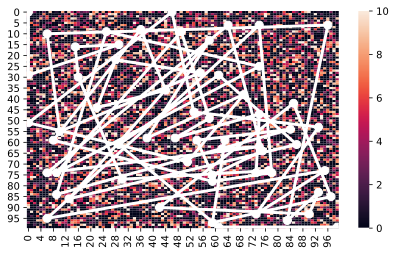

Geração: 2
Total de vértices visitados: 19
Custo total: 79


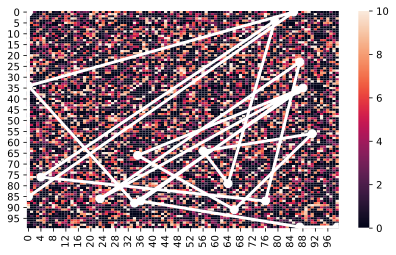

Geração: 5
Total de vértices visitados: 16
Custo total: 73


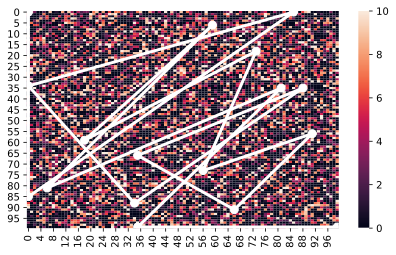

Geração: 59
Total de vértices visitados: 7
Custo total: 25


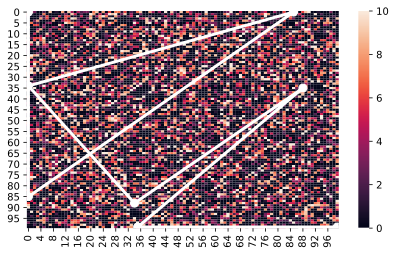

Geração: 653
Total de vértices visitados: 3
Custo total: 12


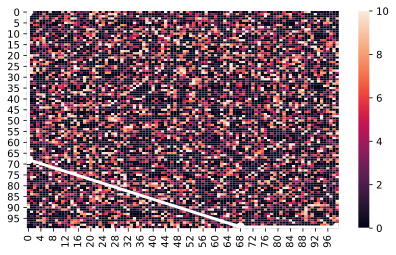

Geração: 882
Total de vértices visitados: 4
Custo total: 10


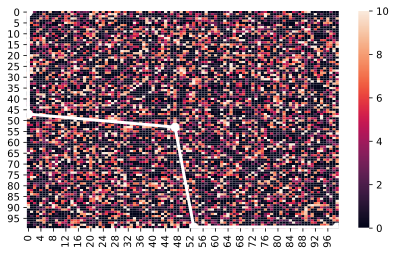

In [14]:
# PARÂMETROS PARA EXECUTAR O ALGORITMO
probabilidadeZero = 0.5
probabilidadeMutacao = 0.05
qtdMinVerticesNovoIndividuo = 50
tamanhoMatriz = 100
tamanhoPopulacao = 8
qtdIteracoes = 1000
qtdCasais = 3

mapa = criarMatrizAdjacencia(probabilidadeZero, tamanhoMatriz)

vetorMinFitness, vetorMediaFitness, vetorMaxFitness = main(mapa, qtdMinVerticesNovoIndividuo, probabilidadeMutacao, tamanhoPopulacao, qtdIteracoes, qtdCasais)

Como é possível observar, o melhor indivíduo da primeira geração tem uma rota um tanto quanto conturbada. Conforme as novas gerações vão surgindo, as rotas vão ficando mais "limpas".

Os gráficos abaixo mostram a evolução dos fitness dos indivíduos ao longo das gerações.

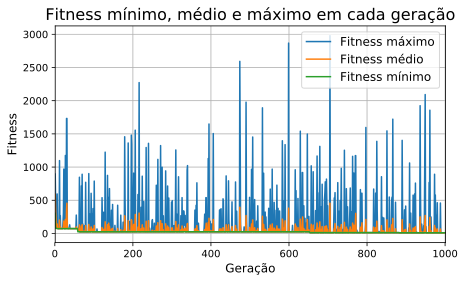

In [15]:
plt.plot(range(1, 1001), vetorMaxFitness, label="Fitness máximo")
plt.plot(range(1, 1001), vetorMediaFitness, label="Fitness médio")
plt.plot(range(1, 1001), vetorMinFitness, label="Fitness mínimo")
plt.xlim(1, 1001)
plt.title("Fitness mínimo, médio e máximo em cada geração")
plt.xlabel("Geração")
plt.ylabel("Fitness")
plt.grid()
plt.legend()
plt.show()

Para verificar se o algoritmo genético produziu um resultado satisfatório, o algoritmo de Dijkstra será utilizado para identificar qual, de fato, é o custo mais baixo para a viagem.

In [16]:
graph = nx.from_numpy_matrix(mapa, create_using=nx.DiGraph())
custoDijkstra = nx.dijkstra_path_length(graph, 0, len(mapa) - 1)
custoAG = vetorMinFitness[len(vetorMinFitness) - 1]

print("Melhor custo encontrado com o algoritmo genético:", custoAG)
print("Melhor custo real (Dijkstra):", custoDijkstra)

diferenca = (custoAG/custoDijkstra)

print("O algoritmo genético encontrou um caminho com custo {:.2f} vezes maior que o ideal.".format(diferenca))

Melhor custo encontrado com o algoritmo genético: 10
Melhor custo real (Dijkstra): 2
O algoritmo genético encontrou um caminho com custo 5.00 vezes maior que o ideal.


Para testar diferentes configurações no algoritmo genético implementado, a célula abaixo realizará 25 iterações. Em cada uma delas, um novo grafo será gerado e serão escolhidos valores aleatórios para compor os parâmetros enviados para a função main, como se segue:

- A probabilidade de não haver ligação entre vértices N e M quaisquer ficará entre 20% e 80%
- A probabilidade de uma mutação ocorrer no nascimento de um novo indivíduo ficará entre 1% e 10%
- O tamanho da população em cada geração será um valor entre 5 e 15 indivíduos
- Metade da população irá sobreviver a cada geração 

Ademais, o tamanho do grafo será sempre de 100 vértices, haverão 1000 gerações e todos os indivíduos da população inicial deverão conter, no mínimo, 50 vértices em suas rotas.

In [17]:
# Total de iterações
nGeracoes = 25

# Vetores para auxiliar a visualização dos dados posteriormente
vetorDijkstra = []
vetorFitnessPrimeiraGeracao = []
vetorFitnessUltimaGeracao = []
vetorProbabilidadeZero = []
vetorProbabilidadeMutacao = []
vetorTamanhoPopulacao = []

# PARÂMETROS FIXOS 
tamanhoMatriz = 100
qtdIteracoes = 1000
qtdMinVerticesNovoIndividuo = 50

for i in range(0, nGeracoes):    
    # PARÂMETROS ALEATÓRIOS
    # Probabilidade de não haver ligação entre os vértices N e M ficará entre 20% e 80%
    # Probabilidade de mutação entre 1% e 10%
    # Tamanho da população entre 5 e 15 indivíduos
    # Metade da população irá sobreviver a cada geração 
    probabilidadeZero = random.randint(20, 80)/100     
    probabilidadeMutacao = random.randint(1, 10)/100    
    tamanhoPopulacao = random.randint(5, 15)    
    qtdCasais = int((tamanhoPopulacao)/4)

    # Criando um mapa diferente a cada iteração
    mapa = criarMatrizAdjacencia(probabilidadeZero, tamanhoMatriz)

    # Executando a função main
    vetorMinFitness, vetorMediaFitness, vetorMaxFitness = main(mapa, qtdMinVerticesNovoIndividuo, probabilidadeMutacao, tamanhoPopulacao, qtdIteracoes, qtdCasais, printar=False)
    
    # Verificando a solução de Dijkstra para o mapa criado
    graph = nx.from_numpy_matrix(mapa, create_using=nx.DiGraph())
    custoDijkstra = nx.dijkstra_path_length(graph, 0, len(mapa) - 1)
    
    # Salvando dados nos vetores para plotar depois
    vetorDijkstra.append(custoDijkstra)
    vetorFitnessPrimeiraGeracao.append(vetorMinFitness[0])
    vetorFitnessUltimaGeracao.append(vetorMinFitness[len(vetorMinFitness) - 1])
    vetorProbabilidadeZero.append(probabilidadeZero)
    vetorProbabilidadeMutacao.append(probabilidadeMutacao)
    vetorTamanhoPopulacao.append(tamanhoPopulacao)

Abaixo, é possível observar como variaram as probabilidades de mutação e de não ligação entre vértices, assim como o tamanho da população, para cada iteração da célula acima.

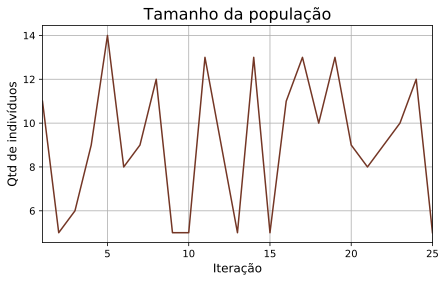

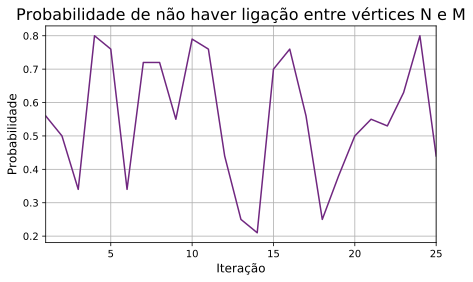

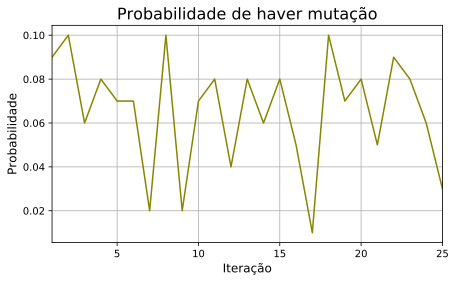

In [18]:
# TAMANHO POPULAÇÃO
plt.plot(range(1, nGeracoes + 1), vetorTamanhoPopulacao, color="#" + str(random.randint(111111, 999999)))
plt.xlim(1, nGeracoes)
plt.xlabel('Iteração')
plt.ylabel('Qtd de indivíduos')
plt.title('Tamanho da população')
plt.grid()
plt.show()

# PROBABILIDADE ZERO
plt.plot(range(1, nGeracoes + 1), vetorProbabilidadeZero, color="#" + str(random.randint(111111, 999999)))
plt.xlim(1, nGeracoes)
plt.xlabel('Iteração')
plt.ylabel('Probabilidade')
plt.title('Probabilidade de não haver ligação entre vértices N e M')
plt.grid()
plt.show()

# PROBABILIDADE DE MUTAÇÃO
plt.plot(range(1, nGeracoes + 1), vetorProbabilidadeMutacao, color="#" + str(random.randint(111111, 999999)))
plt.xlim(1, nGeracoes)
plt.xlabel('Iteração')
plt.ylabel('Probabilidade')
plt.title('Probabilidade de haver mutação')
plt.grid()
plt.show()

Assim como abordado anteriormente, é de extrema importância comparar os resultados obtidos acima com o menor custo real do algoritmo de Dijkstra. 

O gráfico abaixo mostra o melhor fitness da primeira e da última geração do algoritmo genético a fim de observar a evolução das rotas. Também é possível verificar qual teria sido o melhor custo para a viagem no grafo de cada iteração (Dijkstra). 

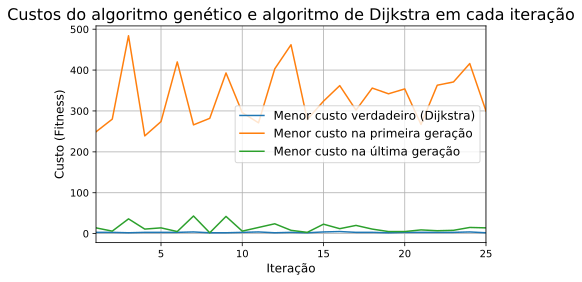

In [19]:
plt.plot(range(1, nGeracoes + 1), vetorDijkstra, label="Menor custo verdadeiro (Dijkstra)")
plt.plot(range(1, nGeracoes + 1), vetorFitnessPrimeiraGeracao, label="Menor custo na primeira geração")
plt.plot(range(1, nGeracoes + 1), vetorFitnessUltimaGeracao, label="Menor custo na última geração")
plt.title("Custos do algoritmo genético e algoritmo de Dijkstra em cada iteração")
plt.xlabel("Iteração")
plt.ylabel("Custo (Fitness)")
plt.xlim(1, nGeracoes)
plt.legend()
plt.grid()
plt.show()

## Discussão sobre os resultados

Pode-se dizer que o algoritmo genético implementado apresentou resultados satisfatórios e esperados. É possível observar nos gráficos dessa atividade que a população, de fato, evoluiu de forma a minimizar o custo necessário para realizar a viagem do primeiro ao último vértice de um grafo. 

É claro que evolução não significa necessariamente produzir indivíduos melhores. A propagação dos genes de gerações anteriores perante os novos indivíduos, em sí, já pode ser considerada evolução, mesmo que não produza indivíduos mais adaptados ao meio. Entretanto, os algoritmos genéticos são elaborados e aplicados visando otimizar a solução de um problema. Logo, espera-se que esses algoritmos produzam resultadas cada vez melhores conforme o passar das gerações e, felizmente, isso pôde ser observado nessa atividade.

No último gráfico exibído, fica nítida a diferença entre o melhor fitness da primeira geração e da última. Em alguns casos, a linha verde chega a tocar a linha azul, indicando que o algoritmo genético atingiu o melhor valor possível.

Ainda é importante ressaltar que, apesar de ter obtido resultados adequados, o algoritmo genético está longe de ser a melhor forma de solucionar o problema proposto. Como referido diversas vezes durante essa atividade, o algoritmo de Dijkstra garante encontrar a melhor rota possível entre dois vértices quaisquer em um grafo de **n** vértices em um tempo muito mais razoável. Além de ser computacionalmente mais custoso, o algoritmo genético não garante encontrar a solução definitiva para o problema. Apesar disso, para fins educacionais, é apropriado utilizar esse tipo de algoritmo, como no caso desse exercício computacional.

## Fontes

https://towardsdatascience.com/introduction-to-genetic-algorithms-including-example-code-e396e98d8bf3

http://www.nce.ufrj.br/GINAPE/VIDA/alggenet.htm

https://github.com/gmichaelson/GA_in_python

https://www.youtube.com/watch?v=uCXm6avugCo

http://www.inf.ufsc.br/grafos/temas/custo-minimo/dijkstra.html

https://networkx.github.io/

https://seaborn.pydata.org/